## Problem Statement

The dataset is from an ongoing cardiovascular study on residents of the town of Framingham, Massachusetts. The classification goal is to predict whether the patient has a 10-year risk of future coronary heart disease (CHD). The dataset provides the patients’ information. It includes over 4,000 records and 15 attributes. Each attribute is a potential risk factor. There are both demographic, behavioral, and medical risk factors.

### Importing Libraries

In [5]:
import pandas as pd
import numpy as np

from sklearn.linear_model import LogisticRegression     #  same for LInearRegression
from sklearn.model_selection import train_test_split   # data split into train_test

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report#classification_report = precision and recall
from sklearn.metrics import roc_auc_score, roc_curve, precision_score, recall_score # evalution matrix  # evalution matrix

import matplotlib.pyplot as plt #for visualiazation
import seaborn as sns  # for visualiazation

import warnings                   # for ignore the warnings we import the liaberery
warnings.filterwarnings('ignore') # # for ignore the warnings we import the liaberery

## 

Data gathering

In [6]:
df = pd.read_csv('CHD_dataset_ml_project.csv') 
df

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3385,3385,60,1.0,F,NO,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0,0
3386,3386,46,1.0,F,NO,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0,0
3387,3387,44,3.0,M,YES,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0,1
3388,3388,60,1.0,M,NO,0.0,NaN,0,1,0,191.0,167.0,105.0,23.01,80.0,85.0,0


In [7]:
df.TenYearCHD.value_counts()

TenYearCHD
0    2879
1     511
Name: count, dtype: int64

## EDA

In [8]:
df['sex'].value_counts()

sex
F    1923
M    1467
Name: count, dtype: int64

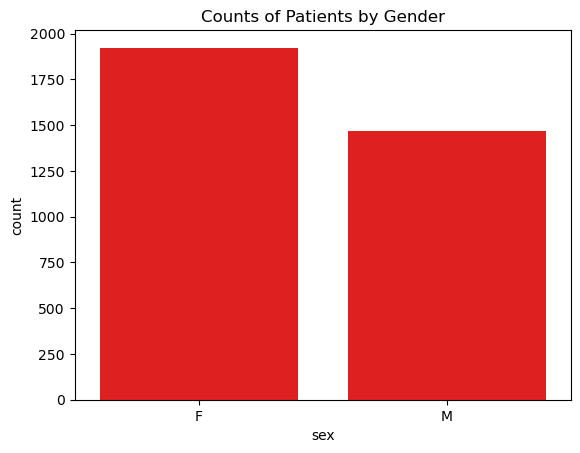

In [9]:
sns.countplot(data=df,x='sex',color='red')
plt.title("Counts of Patients by Gender")
plt.show()

The Count plot shows the distribution of Patients by gender. We can see the number of Male and Female patients in the dataset.Their are more than 1750 Female patients and approximately 1500 male patients.

In [10]:
df['TenYearCHD'].value_counts()

TenYearCHD
0    2879
1     511
Name: count, dtype: int64

<Axes: xlabel='TenYearCHD', ylabel='Count'>

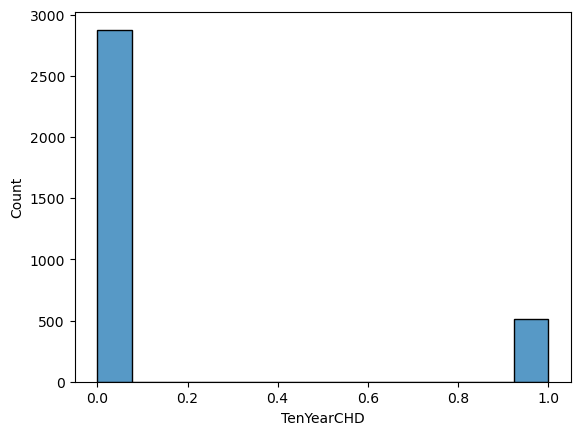

In [11]:
sns.histplot(df['TenYearCHD']) 

Above graph shows that their are 2800 patients has no risk of CHD, and approximately 500 patients has the risk of CHD.

AttributeError: 'numpy.int64' object has no attribute 'startswith'

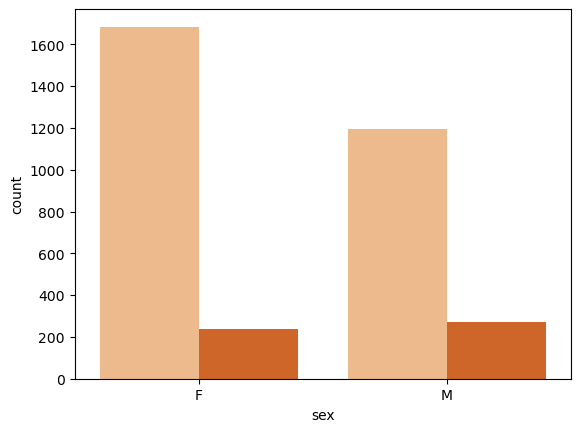

In [39]:
sns.countplot(x='sex',data=df,hue='TenYearCHD',palette='Oranges')


Above Count plot shows that approximately 250 females and 300 males has the risk of CHD.

AttributeError: 'numpy.int64' object has no attribute 'startswith'

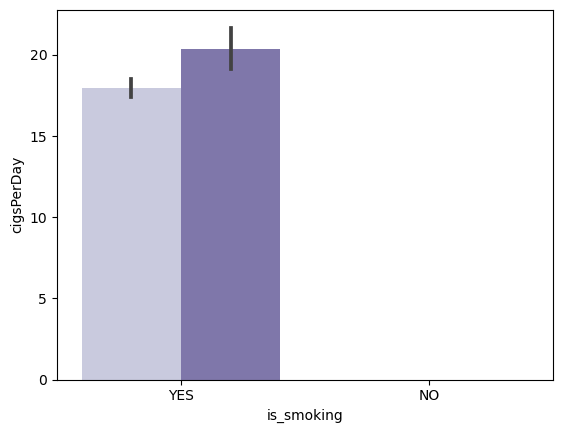

In [40]:
sns.barplot(data=df,x='is_smoking',y='cigsPerDay',hue='TenYearCHD',palette='Purples')
plt.title("CHD risk by Smoking status")

The barplot displays the risk of CHD based on Smoking status. We can observe the difference in CHD risk between Smokers and Non-Smokers.Their are high chances of risk of CHD for the patients who smokes .

<Axes: xlabel='glucose'>

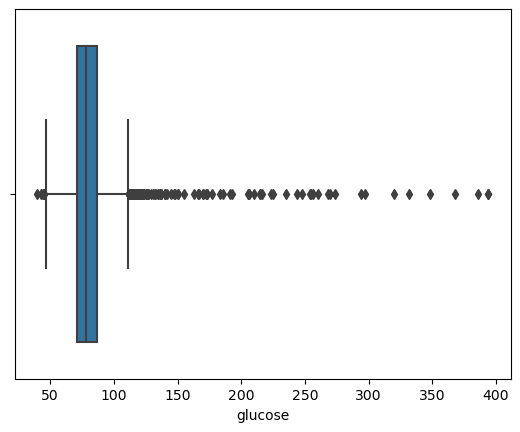

In [41]:
sns.boxplot(data=df,x='glucose')

Here in above plot values above 100 and below 50 are acting as outliers

The Box Plot illustrates the distribution of CHD risk across different age groups.Majority of patients with CHD fall within the age range of 50 to 60.
However there are also some patients with CHD who are older, ranging from 60 to 70years old. 

<Axes: xlabel='cigsPerDay'>

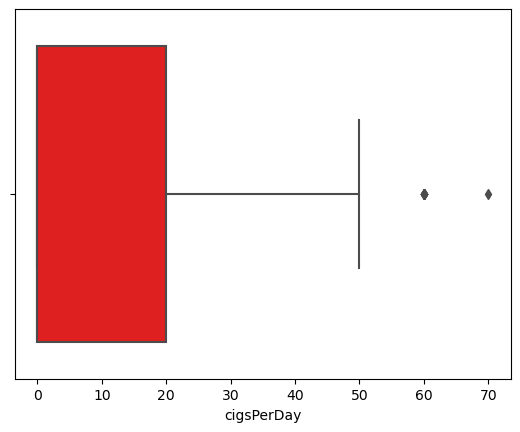

In [42]:
sns.boxplot(data=df,x='cigsPerDay',color='red')

<Axes: xlabel='totChol'>

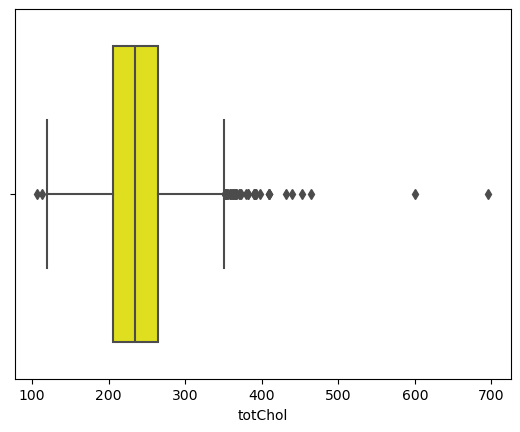

In [43]:
sns.boxplot(data=df,x='totChol',color='yellow')

<Axes: xlabel='BMI'>

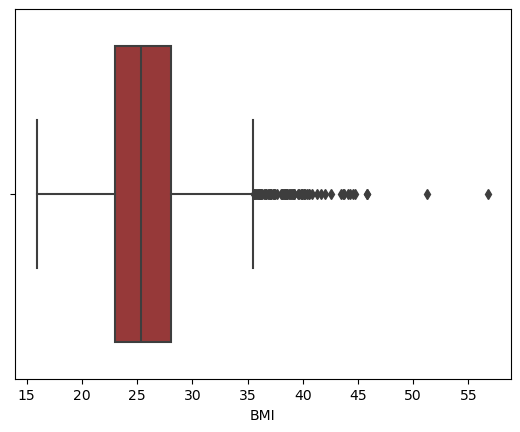

In [44]:
sns.boxplot(data=df,x='BMI',color='brown')

<Axes: xlabel='heartRate'>

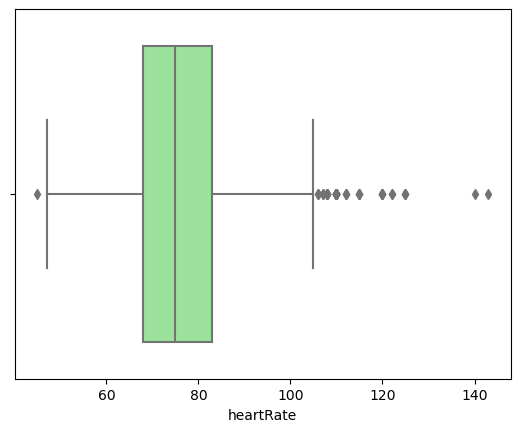

In [45]:
sns.boxplot(data=df,x='heartRate',color='lightgreen')

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3390 non-null   int64  
 1   age              3390 non-null   int64  
 2   education        3303 non-null   float64
 3   sex              3390 non-null   object 
 4   is_smoking       3390 non-null   object 
 5   cigsPerDay       3368 non-null   float64
 6   BPMeds           3346 non-null   float64
 7   prevalentStroke  3390 non-null   int64  
 8   prevalentHyp     3390 non-null   int64  
 9   diabetes         3390 non-null   int64  
 10  totChol          3352 non-null   float64
 11  sysBP            3390 non-null   float64
 12  diaBP            3390 non-null   float64
 13  BMI              3376 non-null   float64
 14  heartRate        3389 non-null   float64
 15  glucose          3086 non-null   float64
 16  TenYearCHD       3390 non-null   int64  
dtypes: float64(9),

AttributeError: 'numpy.int64' object has no attribute 'startswith'

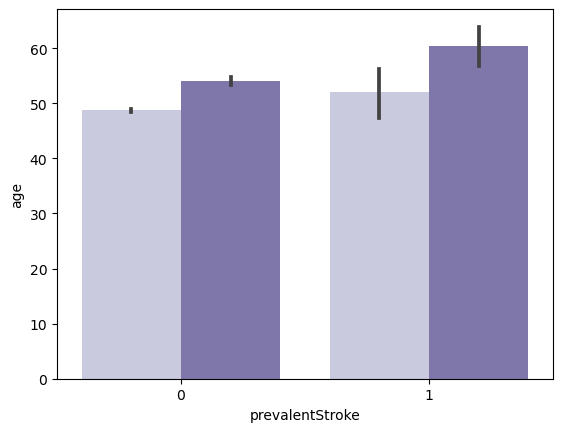

In [47]:
sns.barplot(data=df,x='prevalentStroke',y='age',hue='TenYearCHD',palette='Purples')

We can observe how the prevalance of stroke varries across different age groups. The patients who had history of stroke has age above 50 years and has maximum risk of CHD.

<Axes: ylabel='Density'>

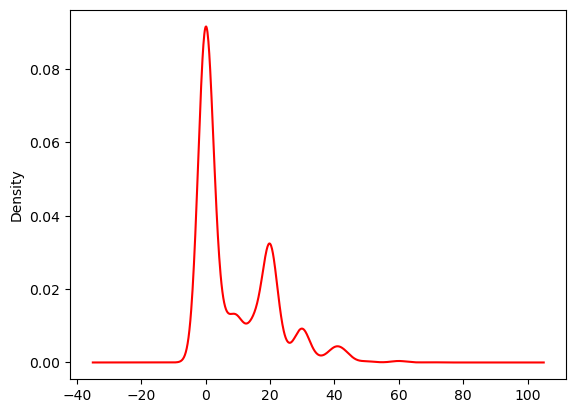

In [48]:
df.cigsPerDay.plot.kde(color='red')  #plot.kde() - is used to generate kde plot which is smoothed, 
                                        #continuous representation of the distribution of data points

Text(0.5, 1.0, 'age')

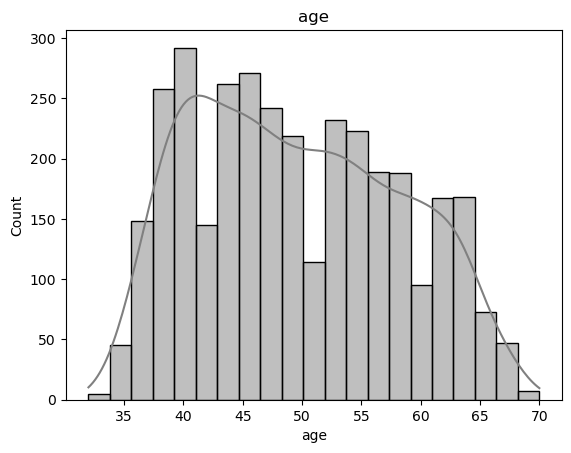

In [49]:
sns.histplot(df['age'],kde=True,color='grey')
plt.title('age')


Text(0.5, 1.0, 'Cigarettes per Day')

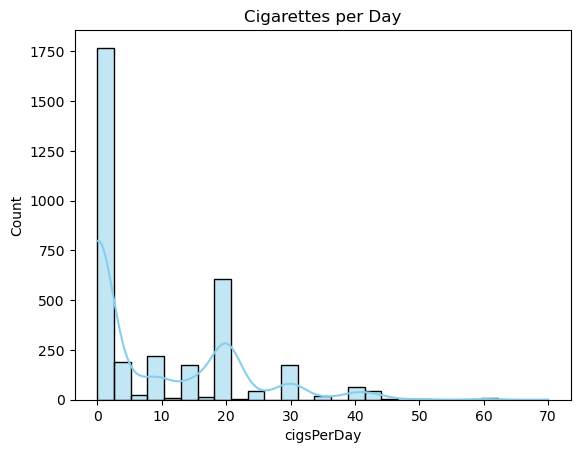

In [50]:
sns.histplot(df['cigsPerDay'],kde=True,color='skyblue')
plt.title('Cigarettes per Day')


Text(0.5, 1.0, 'Body Mass Index')

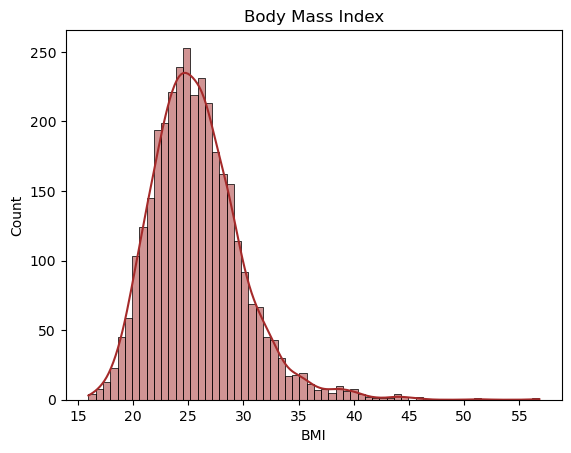

In [51]:
sns.histplot(df['BMI'],kde=True,color='brown')
plt.title('Body Mass Index')


Text(0.5, 1.0, 'Systolic Blood Pressure')

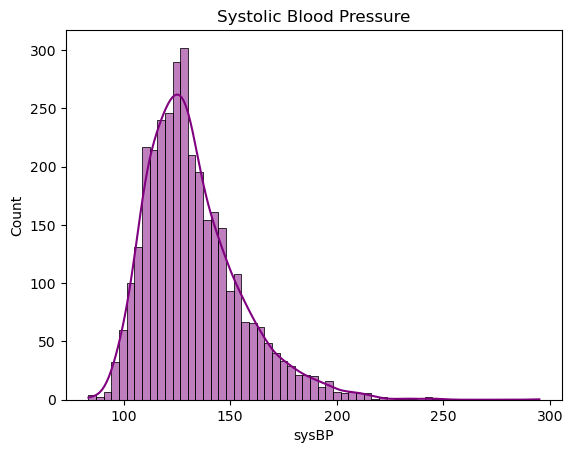

In [52]:
sns.histplot(df['sysBP'],kde=True,color='Purple')
plt.title('Systolic Blood Pressure')


Text(0.5, 1.0, 'Diastolic Blood Pressure')

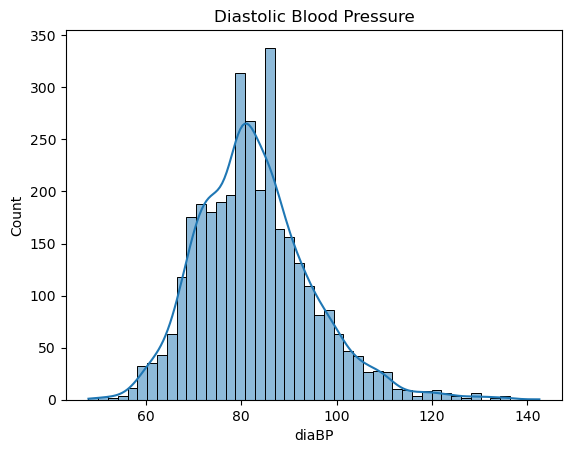

In [53]:
sns.histplot(df['diaBP'],kde=True)
plt.title('Diastolic Blood Pressure')


Correlation between systolic and diastolic_blood_pressure: 0.7819075063169499


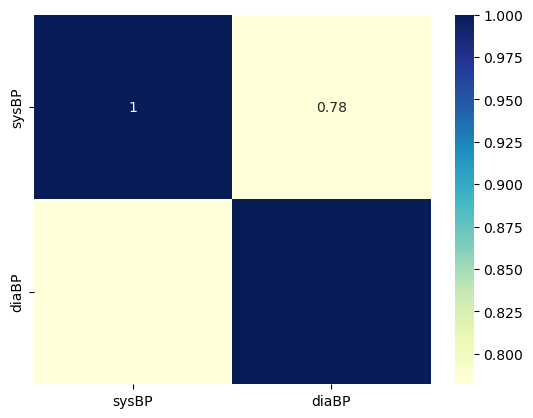

In [54]:
correlation = df['sysBP'].corr(df['diaBP'])
print('Correlation between systolic and diastolic_blood_pressure:',correlation)
sns.heatmap(data=df[['sysBP','diaBP']].corr(), annot=True, cmap='YlGnBu');

### There is positively strong correlation between them.

AttributeError: 'numpy.int64' object has no attribute 'startswith'

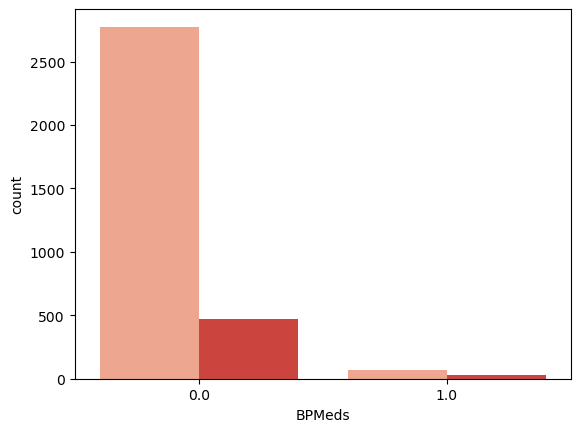

In [55]:
sns.countplot(data=df, x='BPMeds',hue='TenYearCHD',palette='Reds')
plt.title('Blood Pressure Medication')
plt.gca().set_facecolor('lightgrey')


AttributeError: 'numpy.int64' object has no attribute 'startswith'

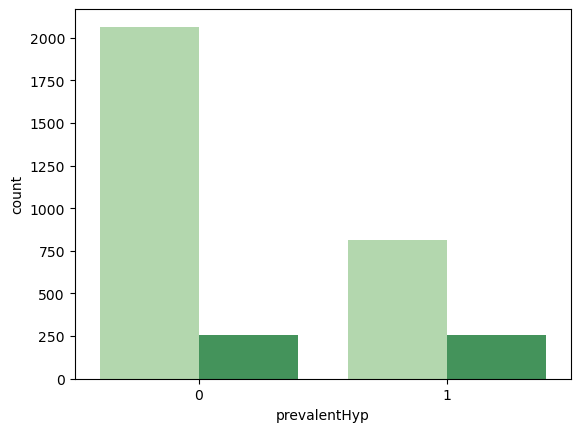

In [56]:
sns.countplot(data=df, x='prevalentHyp',hue='TenYearCHD',palette='Greens')
plt.title('Prevalent Hypertension')


AttributeError: 'numpy.int64' object has no attribute 'startswith'

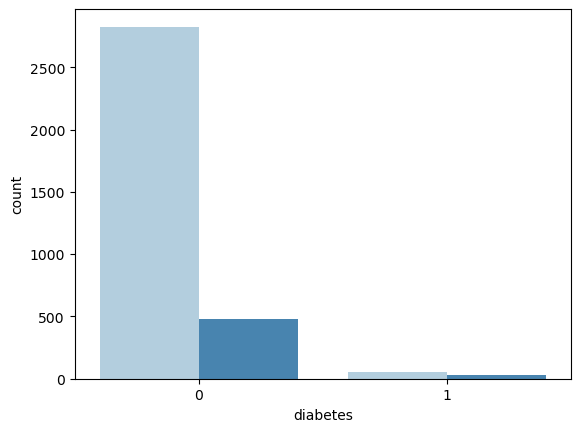

In [57]:
sns.countplot(data=df, x='diabetes',hue='TenYearCHD',palette='Blues')
plt.title('Diabetes')



Text(0.5, 1.0, 'Total Cholesterol')

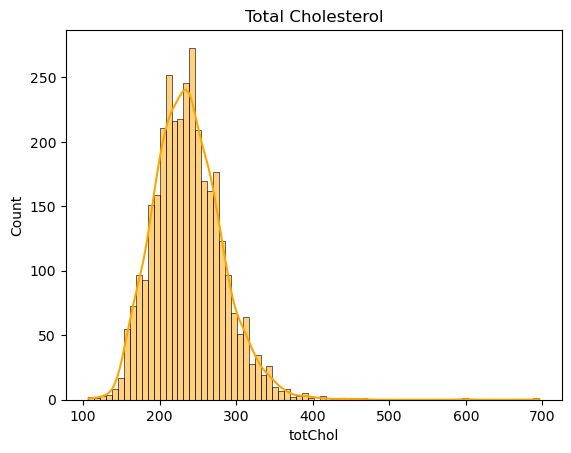

In [58]:

sns.histplot(df['totChol'], kde=True,color='Orange')
plt.title('Total Cholesterol')

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3390 non-null   int64  
 1   age              3390 non-null   int64  
 2   education        3303 non-null   float64
 3   sex              3390 non-null   object 
 4   is_smoking       3390 non-null   object 
 5   cigsPerDay       3368 non-null   float64
 6   BPMeds           3346 non-null   float64
 7   prevalentStroke  3390 non-null   int64  
 8   prevalentHyp     3390 non-null   int64  
 9   diabetes         3390 non-null   int64  
 10  totChol          3352 non-null   float64
 11  sysBP            3390 non-null   float64
 12  diaBP            3390 non-null   float64
 13  BMI              3376 non-null   float64
 14  heartRate        3389 non-null   float64
 15  glucose          3086 non-null   float64
 16  TenYearCHD       3390 non-null   int64  
dtypes: float64(9),

Text(0.5, 1.0, 'Heart Rate')

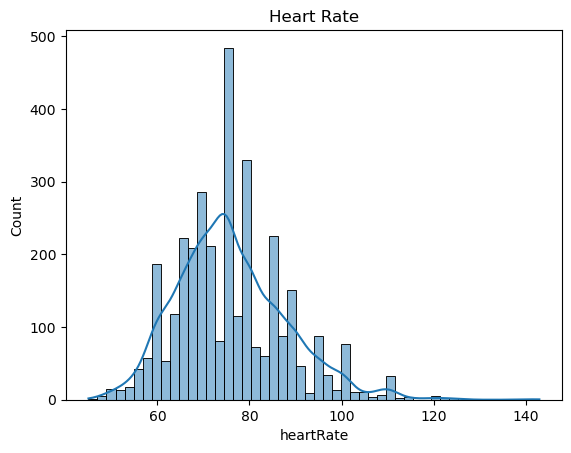

In [60]:
sns.histplot(df['heartRate'],kde=True)
plt.title('Heart Rate')


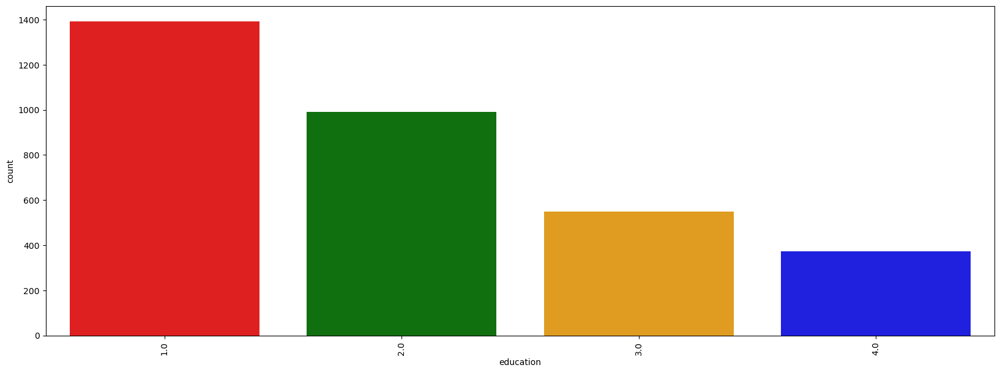

In [61]:
plt.figure(figsize=(20,7))
custom_palette = ['red','green','orange','blue']
sns.countplot(data=df, x='education',palette=custom_palette)
plt.xticks(rotation=90)
plt.show() # this will ensure that the plot is displayed without the text

Text(0.5, 1.0, 'Education Level')

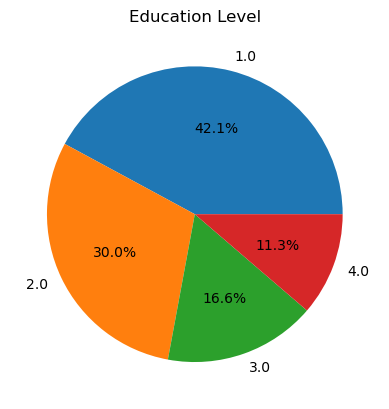

In [62]:
education_counts = df['education'].value_counts()
plt.pie(education_counts, labels=education_counts.index, autopct='%1.1f%%')
plt.title('Education Level')


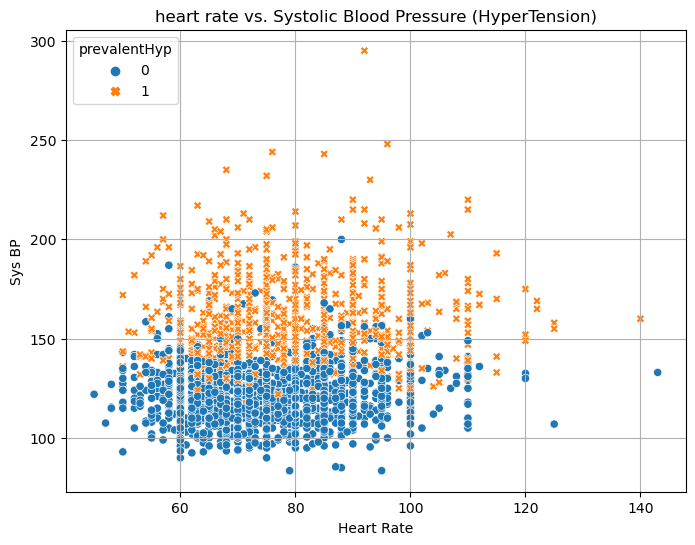

In [63]:
# Plotting Scatter plot for heart rate vs. SysBP
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='heartRate', y='sysBP',hue='prevalentHyp',style='prevalentHyp')
plt.title('heart rate vs. Systolic Blood Pressure (HyperTension)')
plt.xlabel('Heart Rate')
plt.ylabel('Sys BP')
plt.legend(title='prevalentHyp',loc='upper left')
plt.grid(True)
plt.show()

 There appears to be an association between hypertension and higher systolic blood pressure values.The scatter plot shows a separation between individuals with and without hypertension based on their systolic blood pressure readings.
 
 ## For individuals without hypertension (represented by heart rate between 60 to 100 and systolic blood pressure within 100 to 150):
 This suggests that individuals without hypertension tend to have relatively lower systolic blood pressure values compared to those with hypertension
 
 ## For individuals with hypertension (represented by higher systolic blood pressure within 150 to 200):
This indicates that individuals with hypertension tend to have elevated systolic blood pressure levels compared to those without hypertension.

Higher systolic blood pressure values (150 to 200 range) observed in individuals with hypertension suggest an increased risk of cardiovascular complications associated with hypertension.

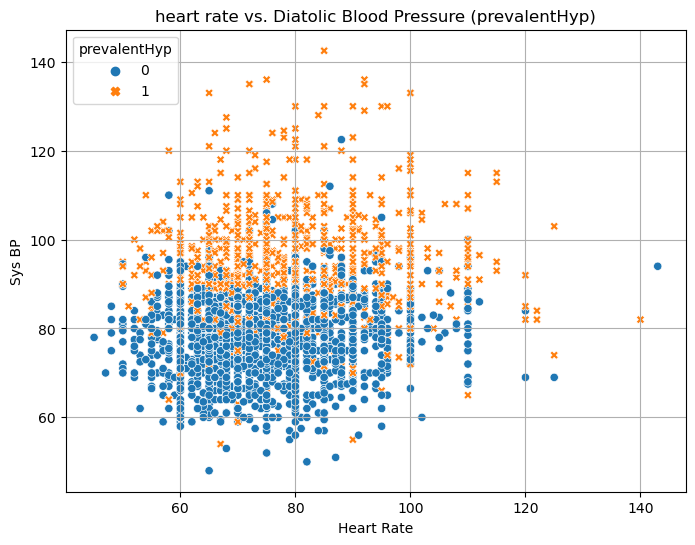

In [64]:
# Plotting Scatter plot for heart rate vs. SysBP
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='heartRate', y='diaBP',hue='prevalentHyp',style='prevalentHyp')
plt.title('heart rate vs. Diatolic Blood Pressure (prevalentHyp)')
plt.xlabel('Heart Rate')
plt.ylabel('Sys BP')
plt.legend(title='prevalentHyp',loc='upper left')
plt.grid(True)
plt.show()

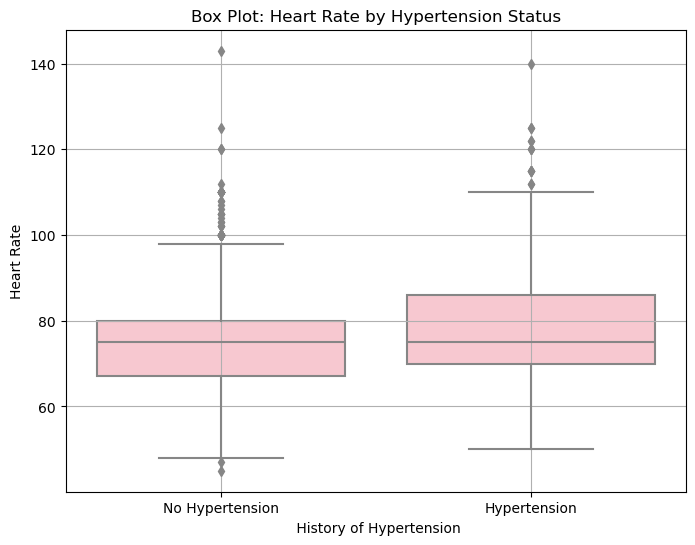

In [65]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='prevalentHyp', y='heartRate',color='pink')
plt.title('Box Plot: Heart Rate by Hypertension Status')
plt.xlabel(' History of Hypertension')
plt.ylabel('Heart Rate')
plt.xticks([0, 1], ['No Hypertension', 'Hypertension'])
plt.grid(True)
plt.show()

#### The above Box Plot shows that patients without hypertension tend to have a slightly higher median heart rate compared to patients with hypertension.
 #### The interquartile range (IQR) indicates the variability in heart rate within each group
 #### The interquartile range (IQR) is within 70 to 87 heart rate for the patients having History of Hypertension, suggesting that most hypertensive patients have heart rates within this range, which is generally slightly higher than non-hypertensive patients.
 #### Both groups have outliers with heart rates significantly higher than the typical range for their respective groups.
#### This suggests that while there are typical heart rate ranges associated with hypertension status, there can still be individuals with extreme heart rate values within each group.

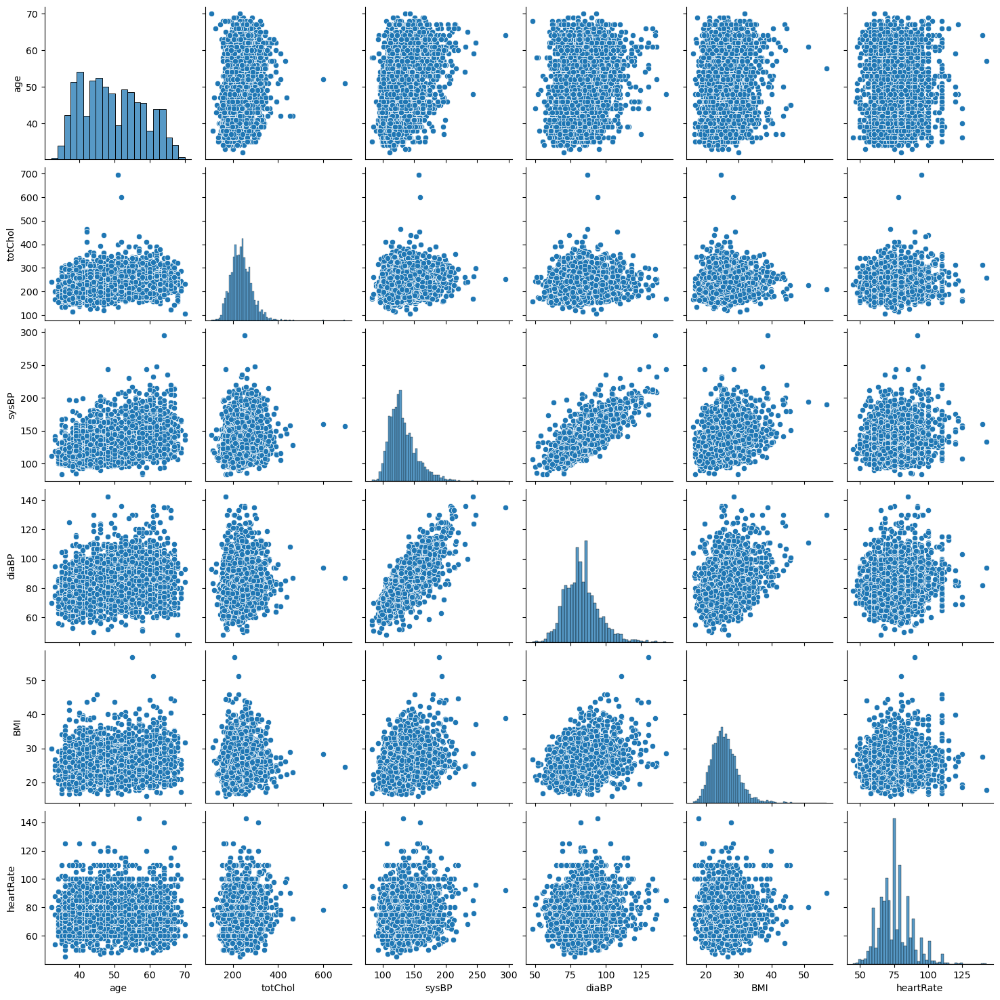

In [66]:
sns.pairplot(data=df[['age','totChol','sysBP','diaBP','BMI','heartRate']])

#### A pairplot shows the relationship between two numeric variables for each pair of columns in the dataset.
#### It creates a grid of axes such that each variable in data will be shared in the y-axis across a single row and in the x-axis across a single column.
#### The pairplot() function of seaborn can be used to create such a plot.

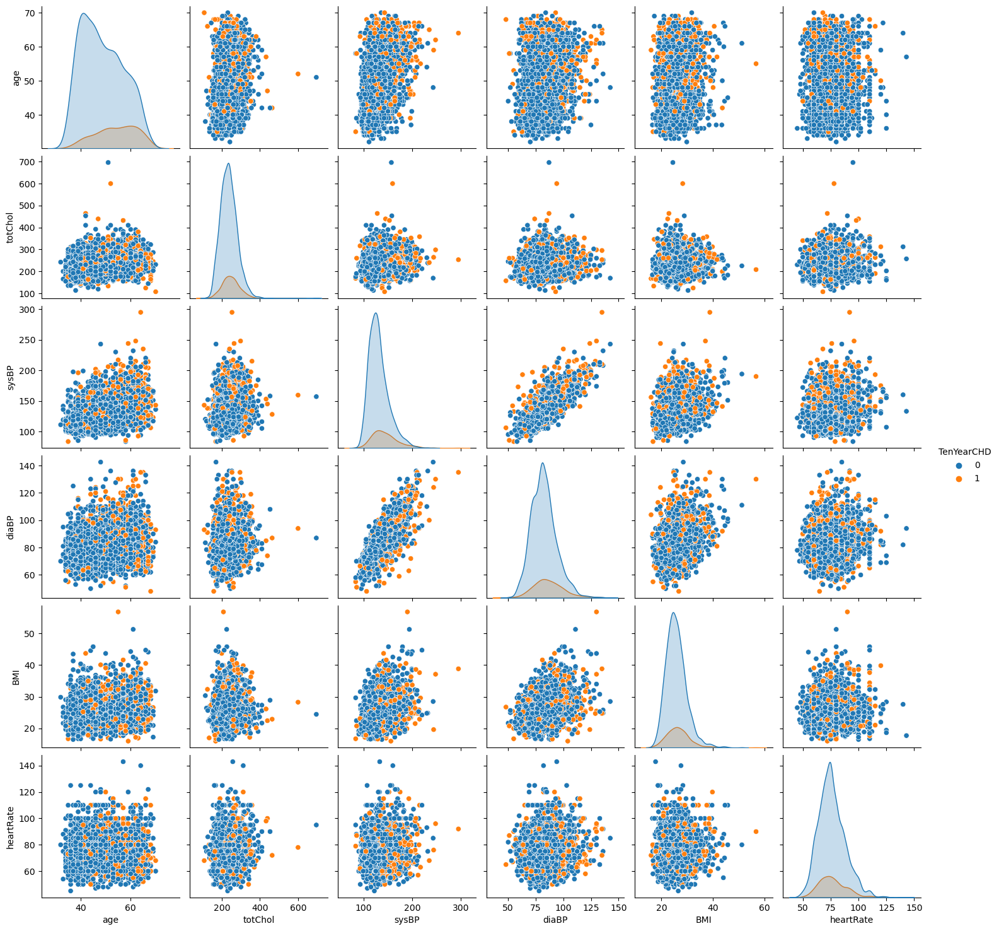

In [71]:
sns.pairplot(data=df,vars=['age','totChol','sysBP','diaBP','BMI','heartRate'],hue='TenYearCHD');

In [68]:
df

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3385,3385,60,1.0,F,NO,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0,0
3386,3386,46,1.0,F,NO,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0,0
3387,3387,44,3.0,M,YES,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0,1
3388,3388,60,1.0,M,NO,0.0,NaN,0,1,0,191.0,167.0,105.0,23.01,80.0,85.0,0


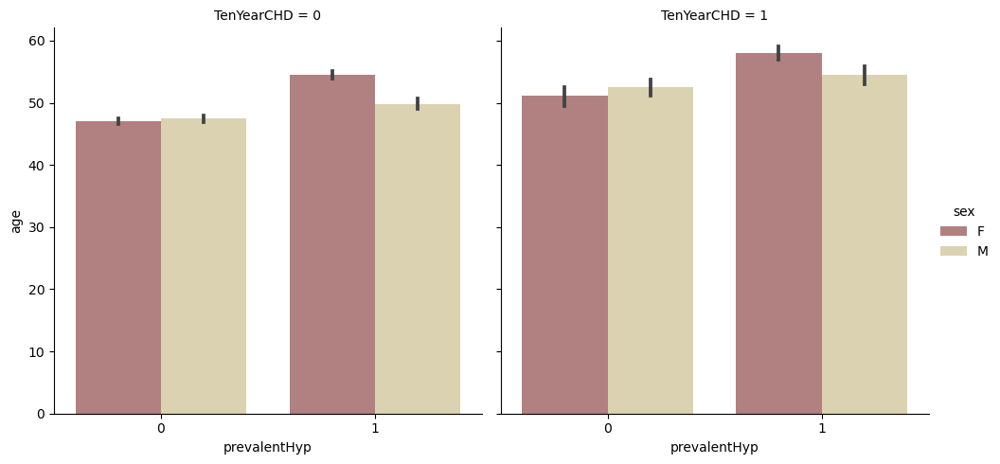

In [69]:
sns.catplot(data=df, x="prevalentHyp", y="age", hue="sex", col="TenYearCHD", kind='bar', palette='pink');


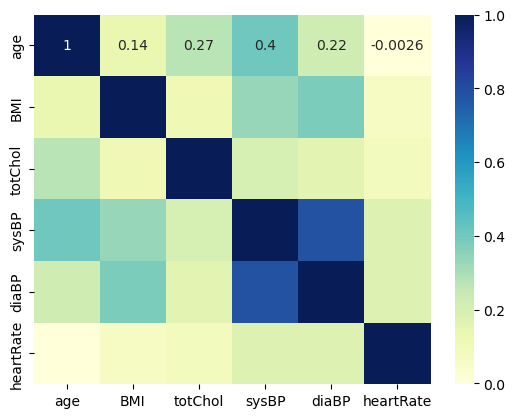

In [70]:
sns.heatmap(data=df[['age','BMI','totChol','sysBP','diaBP','heartRate']].corr(), annot=True, cmap='YlGnBu');

##### A heatmap is a graphical representation of data as a color-encoded matrix.
##### It is a great way of representing the correlation for each pair of columns in the data.
##### The heatmap() function of seaborn helps us to create such a plot.
Here the colors in Heat map represent the strength and direction of the correlations. Positive Correlations are indicated by dark colours while Negative Correlations are indicated by light colours. 
There is strong positive correlation between variables to itself indicating dark colour, and their is also positive correlation in between Systolic Blood Pressure and Diastolic blood pressure ,also in Diastolic blood pressure and Systolic Blood Pressure.

## Handling Missing Values

In [7]:
print(df.isnull().sum())

id                   0
age                  0
education           87
sex                  0
is_smoking           0
cigsPerDay          22
BPMeds              44
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             38
sysBP                0
diaBP                0
BMI                 14
heartRate            1
glucose            304
TenYearCHD           0
dtype: int64


In [8]:
df['glucose'].fillna(df['glucose'].median(),inplace=True)

In [9]:
df.dropna(subset=['education','cigsPerDay','BPMeds','totChol','BMI','heartRate'],inplace=True)

In [10]:
df.info() # check the data

<class 'pandas.core.frame.DataFrame'>
Index: 3189 entries, 1 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3189 non-null   int64  
 1   age              3189 non-null   int64  
 2   education        3189 non-null   float64
 3   sex              3189 non-null   object 
 4   is_smoking       3189 non-null   object 
 5   cigsPerDay       3189 non-null   float64
 6   BPMeds           3189 non-null   float64
 7   prevalentStroke  3189 non-null   int64  
 8   prevalentHyp     3189 non-null   int64  
 9   diabetes         3189 non-null   int64  
 10  totChol          3189 non-null   float64
 11  sysBP            3189 non-null   float64
 12  diaBP            3189 non-null   float64
 13  BMI              3189 non-null   float64
 14  heartRate        3189 non-null   float64
 15  glucose          3189 non-null   float64
 16  TenYearCHD       3189 non-null   int64  
dtypes: float64(9), int6

In [11]:
df['sex'].replace({'F':0, 'M':1}, inplace=True)
df['is_smoking'].replace({'NO':0, 'YES':1}, inplace=True)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3189 entries, 1 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3189 non-null   int64  
 1   age              3189 non-null   int64  
 2   education        3189 non-null   float64
 3   sex              3189 non-null   int64  
 4   is_smoking       3189 non-null   int64  
 5   cigsPerDay       3189 non-null   float64
 6   BPMeds           3189 non-null   float64
 7   prevalentStroke  3189 non-null   int64  
 8   prevalentHyp     3189 non-null   int64  
 9   diabetes         3189 non-null   int64  
 10  totChol          3189 non-null   float64
 11  sysBP            3189 non-null   float64
 12  diaBP            3189 non-null   float64
 13  BMI              3189 non-null   float64
 14  heartRate        3189 non-null   float64
 15  glucose          3189 non-null   float64
 16  TenYearCHD       3189 non-null   int64  
dtypes: float64(9), int6

In [13]:
df['TenYearCHD'].unique() # here TenYearCHD is a target or outcome or depedent variable  = y

array([0, 1], dtype=int64)

In [14]:
df.head()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
1,1,36,4.0,1,0,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,0,1,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,1,1,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,0,1,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0
5,5,61,3.0,0,0,0.0,0.0,0,1,0,272.0,182.0,121.0,32.80,85.0,65.0,1


In [15]:
x = df.drop('TenYearCHD',axis=1) #  x  indepedent variable we have to drop depedent variable only indepedent variables are here
y = df['TenYearCHD'] # y dependent variables are here.

In [16]:
x

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
1,1,36,4.0,1,0,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0
2,2,46,1.0,0,1,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0
3,3,50,1.0,1,1,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0
4,4,64,1.0,0,1,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0
5,5,61,3.0,0,0,0.0,0.0,0,1,0,272.0,182.0,121.0,32.80,85.0,65.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3384,3384,61,1.0,0,0,0.0,0.0,0,1,0,217.0,182.0,86.0,26.98,105.0,113.0
3385,3385,60,1.0,0,0,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0
3386,3386,46,1.0,0,0,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0
3387,3387,44,3.0,1,1,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0


In [17]:
y

1       0
2       0
3       1
4       0
5       1
       ..
3384    0
3385    0
3386    0
3387    1
3389    0
Name: TenYearCHD, Length: 3189, dtype: int64

In [18]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.3, random_state=1) #splitting dataset with 70% for train and 30% for test data.
#random_state=1 means every time we run the code with random_state=1 it will produce the same spillting datasets.

In [19]:
x_train

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
1927,1927,49,1.0,1,1,30.0,0.0,0,0,0,237.0,114.0,85.5,28.57,88.0,92.0
681,681,59,1.0,0,0,0.0,0.0,0,0,0,225.0,132.0,80.0,28.41,58.0,88.0
1319,1319,53,1.0,1,1,20.0,0.0,0,0,0,220.0,123.5,75.0,19.64,78.0,73.0
1240,1240,41,2.0,1,1,5.0,0.0,0,0,0,218.0,129.5,93.0,27.80,58.0,83.0
1823,1823,58,1.0,0,0,0.0,0.0,0,0,0,234.0,137.5,89.5,24.25,58.0,72.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2942,2942,42,3.0,0,0,0.0,0.0,0,1,0,230.0,142.5,79.0,25.15,82.0,99.0
963,963,46,3.0,0,1,25.0,0.0,0,0,0,165.0,99.5,66.0,21.67,72.0,66.0
1163,1163,43,2.0,0,0,0.0,0.0,0,0,0,237.0,130.0,80.0,22.71,65.0,78.0
251,251,35,2.0,0,1,20.0,0.0,0,0,0,231.0,150.0,90.0,23.09,83.0,72.0


In [20]:
y_train.value_counts()

TenYearCHD
0    1919
1     313
Name: count, dtype: int64

In [21]:
x_test

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
426,426,38,2.0,0,0,0.0,0.0,0,0,0,215.0,106.5,75.0,23.82,60.0,67.0
478,478,58,2.0,0,0,0.0,0.0,0,1,0,166.0,185.5,115.5,27.97,100.0,85.0
2701,2701,54,1.0,0,0,0.0,0.0,0,0,0,207.0,137.5,89.0,25.43,63.0,72.0
16,16,50,1.0,0,0,0.0,0.0,0,1,0,240.0,163.0,105.0,31.37,89.0,75.0
48,48,55,1.0,0,1,10.0,0.0,0,0,0,346.0,131.0,81.0,22.69,75.0,77.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1599,1599,51,2.0,1,1,13.0,0.0,0,0,0,245.0,137.0,76.0,22.26,83.0,73.0
2066,2066,39,2.0,1,1,20.0,0.0,0,0,0,310.0,134.0,90.0,35.11,69.0,88.0
437,437,41,4.0,0,0,0.0,0.0,0,0,0,205.0,110.0,69.0,25.99,75.0,67.0
38,38,41,2.0,0,1,9.0,1.0,1,1,0,180.0,114.0,70.0,22.41,92.0,78.0


In [22]:
y_test

426     0
478     0
2701    0
16      0
48      0
       ..
1599    0
2066    0
437     0
38      0
1247    1
Name: TenYearCHD, Length: 957, dtype: int64

# Logistic Regression

### Standardization - Scaling Technique

In [23]:
from sklearn.preprocessing import StandardScaler # for scaling techunque


In [24]:
#Initialize StandardScaler
scaler=StandardScaler()
#Fit and Transform the training data
x_train_scaled = scaler.fit_transform(x_train)
#Transform the testing data(using the same scaler fitted on training data )
x_test_scaled = scaler.transform(x_test)

In [25]:
#Initialize logistic Regression model
log_model =LogisticRegression()

In [26]:
#fit the model on scaled training data
log_model.fit(x_train_scaled,y_train)

LogisticRegression()

In [27]:
#make Predictions on scale testing data
y_pred = log_model.predict(x_test_scaled) 
y_pred[:6]

array([0, 0, 0, 0, 0, 0], dtype=int64)

In [28]:
y_test[100:106] # Yactual

1774    0
1787    0
806     0
2099    0
3219    0
2501    0
Name: TenYearCHD, dtype: int64

## Evaluation

In [29]:
## Testing Data Evalution
cnf_matrix = confusion_matrix(y_test,y_pred)
print('confusion matrix :\n',cnf_matrix)

acc_score_LR = accuracy_score(y_test,y_pred)
print("Accuracy Score : ",acc_score_LR)

clf_report = classification_report(y_test , y_pred)
print('classification_report : \n',clf_report)

confusion matrix :
 [[792   3]
 [155   7]]
Accuracy Score :  0.8349007314524556
classification_report : 
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       795
           1       0.70      0.04      0.08       162

    accuracy                           0.83       957
   macro avg       0.77      0.52      0.50       957
weighted avg       0.81      0.83      0.77       957




TP  >>792 #The patients does have "TenYearCHD" and model also predict as patient does have "TenYearCHD"..   
TN  >> 7 # The patients does not have "TenYearCHD" and model also predict as patient does not have "TenYearCHD"..
FP  >> 3 #  The patients does not have "TenYearCHD" but model predict as patient does have "TenYearCHD".
FN  >> 155 # The patients does have "TenYearCHD" but model predict as patient does not have "TenYearCHD".

from above confusion matrix the Accuracy rate is 83%

Precision:
 P(0): Model correctly predicts 84% of patients who actually dont have TenYearCHD.
 P(1): Model correctly predicts 70% of patients who actually have TenYearCHD.

Recall:
 R(0): 100% of patients who dont have TenYearCHD are correctly predicted.
 R(1): 4% of patients who have TenYearCHD are correctly predicted.


In [30]:
fpr , tpr, thresh = roc_curve(y_test, y_pred)

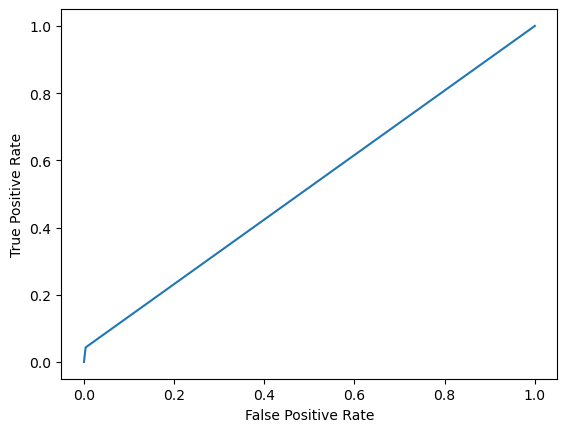

In [31]:
plt.plot(fpr, tpr) # by this graph we check hamara classifier kitna achha work karta hai .
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('ROC_Curve.png')

The models performance is quite good to distinguished between positive and negative cases.

# KNN

In [32]:
from sklearn.preprocessing import MinMaxScaler# for scaling techunque
from sklearn.model_selection import train_test_split, GridSearchCV
# we use classifiction model we choose either a classsifier or regression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


In [33]:
# before we apply knn we have to do a scaling techinque in knn.

## Normalization - scaling techinque

In [34]:
Norm = MinMaxScaler()
#Norm.fit(x)
Norm_array = Norm.fit_transform(x)
df_new = pd.DataFrame(Norm_array,columns=x.columns)
df_new

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
0,0.000000,0.105263,1.000000,1.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.203285,0.399527,0.529101,0.338149,0.275510,0.098870
1,0.000295,0.368421,0.000000,0.0,1.0,0.142857,0.0,0.0,0.0,0.0,0.281314,0.153664,0.243386,0.107493,0.438776,0.152542
2,0.000590,0.473684,0.000000,1.0,1.0,0.285714,0.0,0.0,1.0,0.0,0.246407,0.352246,0.423280,0.301175,0.234694,0.152542
3,0.000885,0.842105,0.000000,0.0,1.0,0.428571,0.0,0.0,0.0,0.0,0.262834,0.250591,0.391534,0.256121,0.255102,0.104520
4,0.001181,0.763158,0.666667,0.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.326489,0.465721,0.772487,0.412341,0.408163,0.070621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3184,0.998524,0.763158,0.000000,0.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.213552,0.465721,0.402116,0.269833,0.612245,0.206215
3185,0.998819,0.736842,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.303901,0.189125,0.328042,0.326151,0.255102,0.177966
3186,0.999115,0.368421,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.176591,0.087470,0.084656,0.146915,0.357143,0.124294
3187,0.999410,0.315789,0.666667,1.0,1.0,0.042857,0.0,0.0,1.0,0.0,0.490760,0.380615,0.751323,0.317336,0.285714,0.090395


## Splitting the data

In [35]:
x_train, x_test, y_train, y_test = train_test_split(df_new, y, test_size=0.3, random_state=1) # df_new = new splitting dataframe 

## Model Training

In [36]:
Knn_model = KNeighborsClassifier()  # knn_model = instance created,creating KNN Classifier
Knn_model.fit(x_train,y_train)   #fit the model for training data

KNeighborsClassifier()

### Evaluation

In [37]:
## Testing Data Evualation
y_pred = Knn_model.predict(x_test)
cf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix is:\n', cf_matrix)

acc_score_test= accuracy_score(y_test, y_pred)
print('\nAccuracy is:',acc_score_test)

clf_Report = classification_report(y_test, y_pred)
print('\nClassification Report is:\n',clf_Report)


Confusion Matrix is:
 [[774  21]
 [154   8]]

Accuracy is: 0.8171368861024033

Classification Report is:
               precision    recall  f1-score   support

           0       0.83      0.97      0.90       795
           1       0.28      0.05      0.08       162

    accuracy                           0.82       957
   macro avg       0.55      0.51      0.49       957
weighted avg       0.74      0.82      0.76       957



### For Testing Data
TP  >>774 #The patients does have "TenYearCHD" and model also predict as patient does have "TenYearCHD"..   
TN  >> 8 # The patients does not have "TenYearCHD" and model also predict as patient does not have "TenYearCHD"..
FP  >> 21 #  The patients does not have "TenYearCHD" but model predict as patient does have "TenYearCHD".
FN  >> 154 # The patients does have "TenYearCHD" but model predict as patient does not have "TenYearCHD".

from above confusion matrix the Accuracy rate is 82%

Precision:
 P(0): Model correctly predicts 83% of patients who actually dont have TenYearCHD.
 P(1): Model correctly predicts 28% of patients who actually have TenYearCHD.

Recall:
 R(0): 97% of patients who dont have TenYearCHD are correctly predicted.
 R(1): 5% of patients who have TenYearCHD are correctly predicted.


In [38]:
## Training Data Evaluation
y_pred_train = Knn_model.predict(x_train)
cf_matrix = confusion_matrix(y_train,y_pred_train)
print('\nConfusion Matrix is:\n', cf_matrix)

acc_score_knn= accuracy_score(y_train,y_pred_train)
print('\nAccuracy is:',acc_score_knn)

clf_Report = classification_report(y_train,y_pred_train)
print('\nClassification Report is:\n',clf_Report)


Confusion Matrix is:
 [[1897   22]
 [ 268   45]]

Accuracy is: 0.8700716845878136

Classification Report is:
               precision    recall  f1-score   support

           0       0.88      0.99      0.93      1919
           1       0.67      0.14      0.24       313

    accuracy                           0.87      2232
   macro avg       0.77      0.57      0.58      2232
weighted avg       0.85      0.87      0.83      2232



### For training Data

TP  >>1897 #The patients does have "TenYearCHD" and model also predict as patient does have "TenYearCHD"..   
TN  >> 45 # The patients does not have "TenYearCHD" and model also predict as patient does not have "TenYearCHD"..
FP  >> 22 #  The patients does not have "TenYearCHD" but model predict as patient does have "TenYearCHD".
FN  >> 268 # The patients does have "TenYearCHD" but model predict as patient does not have "TenYearCHD".

from above confusion matrix the Accuracy rate is 87%

Precision:
 P(0): Model correctly predicts 88% of patients who actually dont have TenYearCHD.
 P(1): Model correctly predicts 67% of patients who actually have TenYearCHD.

Recall:
 R(0): 99% of patients who dont have TenYearCHD are correctly predicted.
 R(1): 14% of patients who have TenYearCHD are correctly predicted.


## Hyperparameter Tunning

In [39]:
knn_model = KNeighborsClassifier()
hyp = {'p':[1,2],  # p - parameter(distance metric) 1 = manhaton distance, 2 = Euclodean d"istance
       'n_neighbors' : np.arange(3,30)} 
gscv_knn_model = GridSearchCV(knn_model, hyp, cv=5) # cv= cross validation
gscv_knn_model.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'p': [1, 2]})

In [40]:
gscv_knn_model.best_params_     

{'n_neighbors': 18, 'p': 2}

In [41]:
y_pred_new = gscv_knn_model.predict(x_test)

acc_score_KNN= accuracy_score(y_test,y_pred_new)
print('Accuracy:', acc_score_KNN) # testing Accuracy

Accuracy: 0.8307210031347962


# Decision tree 


In [42]:

from sklearn.tree import DecisionTreeClassifier, plot_tree #(this is for plotting tree)
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [43]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train,y_train)


DecisionTreeClassifier()

In [44]:
# Testing data evaluation
y_pred = dt_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print('confusion matrix :\n',cnf_matrix)

acc_score_DT = accuracy_score(y_test,y_pred)
print("Accuracy Score : ",acc_score_DT)

clf_report = classification_report(y_test , y_pred)
print('classification_report : \n',clf_report)



confusion matrix :
 [[682 113]
 [123  39]]
Accuracy Score :  0.7533960292580982
classification_report : 
               precision    recall  f1-score   support

           0       0.85      0.86      0.85       795
           1       0.26      0.24      0.25       162

    accuracy                           0.75       957
   macro avg       0.55      0.55      0.55       957
weighted avg       0.75      0.75      0.75       957



### For testing Data

TP  >>682 #The patients does have "TenYearCHD" and model also predict as patient does have "TenYearCHD"..   
TN  >> 39 # The patients does not have "TenYearCHD" and model also predict as patient does not have "TenYearCHD"..
FP  >> 113 #  The patients does not have "TenYearCHD" but model predict as patient does have "TenYearCHD".
FN  >> 124 # The patients does have "TenYearCHD" but model predict as patient does not have "TenYearCHD".

from above confusion matrix the Accuracy rate is 75%

Precision:
 P(0): Model correctly predicts 85% of patients who actually dont have TenYearCHD.
 P(1): Model correctly predicts 26% of patients who actually have TenYearCHD.

Recall:
 R(0): 86% of patients who dont have TenYearCHD are correctly predicted.
 R(1): 24% of patients who have TenYearCHD are correctly predicted.


In [45]:
# Training data evaluation
y_pred_train= dt_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred_train)
print('confusion matrix :\n',cnf_matrix)

acc_score_dt = accuracy_score(y_train,y_pred_train)
print("Accuracy Score : ",acc_score_dt)

clf_report = classification_report(y_train,y_pred_train)
print('classification_report : \n',clf_report)

confusion matrix :
 [[1919    0]
 [   0  313]]
Accuracy Score :  1.0
classification_report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1919
           1       1.00      1.00      1.00       313

    accuracy                           1.00      2232
   macro avg       1.00      1.00      1.00      2232
weighted avg       1.00      1.00      1.00      2232



### For training Data

TP  >>1919 #The patients does have "TenYearCHD" and model also predict as patient does have "TenYearCHD"..   
TN  >> 313 # The patients does not have "TenYearCHD" and model also predict as patient does not have "TenYearCHD"..
FP  >> 0 #  The patients does not have "TenYearCHD" but model predict as patient does have "TenYearCHD".
FN  >> 0 # The patients does have "TenYearCHD" but model predict as patient does not have "TenYearCHD".

from above confusion matrix the Accuracy rate is 100%

Precision:
 P(0): Model correctly predicts 100% of patients who actually dont have TenYearCHD.
 P(1): Model correctly predicts 100% of patients who actually have TenYearCHD.

Recall:
 R(0): 100% of patients who dont have TenYearCHD are correctly predicted.
 R(1): 100% of patients who have TenYearCHD are correctly predicted.


In [46]:
dt_model=DecisionTreeClassifier()
hyp = {'criterion':['gini','entropy'],
       'max_depth':np.arange(2,10),
       'min_samples_split':np.arange(2,10),
       'min_samples_leaf':np.arange(2,10)
        
      
      }
rscv_model = RandomizedSearchCV(dt_model,hyp,random_state=10,cv=5)
rscv_model.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_leaf': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_split': array([2, 3, 4, 5, 6, 7, 8, 9])},
                   random_state=10)

In [47]:
rscv_model.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=2, min_samples_leaf=3,
                       min_samples_split=9)

In [48]:
dt_model = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=2,
                      min_samples_split=7)
dt_model.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=2,
                       min_samples_split=7)

In [51]:
plt.figure(figsize=(200,200))# used matplotlib library here
tree = plot_tree(dt_model, feature_names=x.columns, filled=True)
plt.savefig('Decision_Tree_reg.png')

# Random Forest

In [52]:
from sklearn.model_selection import train_test_split, GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.ensemble import RandomForestClassifier

In [53]:
# Model Training with DT
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train,y_train)
# dt_model.cost_complexity_prunning_path(x_train,y_train)

DecisionTreeClassifier()

In [54]:
y_pred = dt_model.predict(x_test)

In [55]:
dt_acc = accuracy_score(y_test, y_pred)
print('Accuracy for DT is :', dt_acc)

Accuracy for DT is : 0.7690700104493208


In [56]:
# Model Training with RF
rf_model = RandomForestClassifier()
rf_model.fit(x_train,y_train)

RandomForestClassifier()

In [57]:
y_pred_rf = rf_model.predict(x_test)

In [58]:
rf_acc = accuracy_score(y_test, y_pred_rf)
print('Accuracy for RF is :', rf_acc)

Accuracy for RF is : 0.8338557993730408


In [59]:
rf_model = RandomForestClassifier()

hyp = {'criterion': ['gini','entropy'],
       'n_estimators': np.arange(10,200,10),
       'max_depth': np.arange(2,10),
       'min_samples_split': np.arange(2,20),
       'min_samples_leaf': np.arange(2,10)}

rscv_rf_clf = RandomizedSearchCV(rf_model, hyp, cv=7)
rscv_rf_clf.fit(x_train,y_train)

RandomizedSearchCV(cv=7, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_leaf': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19]),
                                        'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])})

In [60]:
rscv_rf_clf.best_estimator_

RandomForestClassifier(max_depth=9, min_samples_leaf=8, min_samples_split=5,
                       n_estimators=110)

In [61]:
rf_model = RandomForestClassifier(max_depth=8, 
                                  min_samples_leaf=2,
                                  min_samples_split=8, 
                                  n_estimators=80,
                                  max_features='sqrt',
                                  oob_score = True) 
rf_model.fit(x_train,y_train)

RandomForestClassifier(max_depth=8, min_samples_leaf=2, min_samples_split=8,
                       n_estimators=80, oob_score=True)

In [62]:
# Train data Accuracy
y_pred_train = rf_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred_train)
print('\nConfusion MAtrix: ',cnf_matrix)

acc_score_rf = accuracy_score(y_train,y_pred_train)
print('\nAccuracy score is', acc_score_rf)

clf_report = classification_report(y_train,y_pred_train)
print('classification_report : \n',clf_report)


Confusion MAtrix:  [[1919    0]
 [ 269   44]]

Accuracy score is 0.8794802867383512
classification_report : 
               precision    recall  f1-score   support

           0       0.88      1.00      0.93      1919
           1       1.00      0.14      0.25       313

    accuracy                           0.88      2232
   macro avg       0.94      0.57      0.59      2232
weighted avg       0.89      0.88      0.84      2232



In [63]:
# Test data Accuracy
y_pred = rf_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print('\nConfusion MAtrix:\n ',cnf_matrix)

acc_score_RF = accuracy_score(y_test,y_pred)
print('\nAccuracy score is\n', acc_score_RF)

clf_report = classification_report(y_train,y_pred_train)
print('classification_report : \n',clf_report)


Confusion MAtrix:
  [[793   2]
 [157   5]]

Accuracy score is
 0.8338557993730408
classification_report : 
               precision    recall  f1-score   support

           0       0.88      1.00      0.93      1919
           1       1.00      0.14      0.25       313

    accuracy                           0.88      2232
   macro avg       0.94      0.57      0.59      2232
weighted avg       0.89      0.88      0.84      2232



In [64]:
rf_model.oob_score_

0.857078853046595

In [65]:
print('acc_score_LR :',acc_score_LR,'acc_score_KNN :',acc_score_KNN,'acc_score_DT :',acc_score_DT,'acc_score_RF :',acc_score_RF)

acc_score_LR : 0.8349007314524556 acc_score_KNN : 0.8307210031347962 acc_score_DT : 0.7533960292580982 acc_score_RF : 0.8338557993730408


#### The Recall of the minority class is very less. It proves that the model is more biased towards majority class.
#### So, it proves that the model is not the best model. Thats why we have to use Over_Smapling (SMOTE) technique to increase the minority class
#### and see their accuracy and recall results.

# Balancing the Imbalance Data

In [66]:
print("Before OverSampling, counts of label '1': {} \n".format(sum(y_train == 1))) 

print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) 


Before OverSampling, counts of label '1': 313 

Before OverSampling, counts of label '0': 1919 



In [67]:
#Appling smote for over_sampling
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
x_train_sm,y_train_sm = smote.fit_resample(x_train,y_train)

In [68]:
pip install -u imbalanced-learn

Note: you may need to restart the kernel to use updated packages.



Usage:   
  C:\Users\hp\anaconda3\python.exe -m pip install [options] <requirement specifier> [package-index-options] ...
  C:\Users\hp\anaconda3\python.exe -m pip install [options] -r <requirements file> [package-index-options] ...
  C:\Users\hp\anaconda3\python.exe -m pip install [options] [-e] <vcs project url> ...
  C:\Users\hp\anaconda3\python.exe -m pip install [options] [-e] <local project path> ...
  C:\Users\hp\anaconda3\python.exe -m pip install [options] <archive url/path> ...

no such option: -u


In [69]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

In [70]:
print("After OverSampling, counts of label '1': {}".format(sum(y_train_sm == 1))) 

print("After OverSampling, counts of label '0': {}".format(sum(y_train_sm == 0)))

After OverSampling, counts of label '1': 1919
After OverSampling, counts of label '0': 1919


## Logistic Regression

In [71]:
log_model =LogisticRegression()

In [72]:
#fit the model on scaled training data
log_model.fit(x_train_sm,y_train_sm)

LogisticRegression()

In [73]:
#make Predictions on scale testing data
y_pred = log_model.predict(x_test_scaled) 
y_pred[:6]

array([0, 0, 0, 0, 1, 0], dtype=int64)

In [74]:
y_test[100:106] # Yactual

1774    0
1787    0
806     0
2099    0
3219    0
2501    0
Name: TenYearCHD, dtype: int64

### Evalution

In [75]:
## Testing Data Evalution
cnf_matrix = confusion_matrix(y_test,y_pred)
print('confusion matrix :\n',cnf_matrix)

acc_score_LR = accuracy_score(y_test,y_pred)
print("Accuracy Score : ",acc_score_LR)

clf_report = classification_report(y_test , y_pred)
print('classification_report : \n',clf_report)

confusion matrix :
 [[625 170]
 [ 82  80]]
Accuracy Score :  0.7366771159874608
classification_report : 
               precision    recall  f1-score   support

           0       0.88      0.79      0.83       795
           1       0.32      0.49      0.39       162

    accuracy                           0.74       957
   macro avg       0.60      0.64      0.61       957
weighted avg       0.79      0.74      0.76       957



#### We have reduced the accuracy to 73% as compared to previous model but the recall value of minority class has also improved to 49 %. 
#### This is a good model compared to the previous one. Recall is better. 

In [76]:
y_pred_prob= log_model.predict_proba(x_test) # for prediction of observationes
y_pred_prob

array([[0.87587287, 0.12412713],
       [0.42048021, 0.57951979],
       [0.60603854, 0.39396146],
       ...,
       [0.87106878, 0.12893122],
       [0.81246277, 0.18753723],
       [0.58160882, 0.41839118]])

In [77]:
fpr , tpr, thresh = roc_curve(y_test, y_pred_prob[:,1])

In [78]:
tpr

array([0.        , 0.00617284, 0.01851852, 0.01851852, 0.02469136,
       0.02469136, 0.03703704, 0.03703704, 0.04938272, 0.04938272,
       0.05555556, 0.05555556, 0.0617284 , 0.0617284 , 0.08024691,
       0.08024691, 0.08641975, 0.08641975, 0.09259259, 0.09259259,
       0.09876543, 0.09876543, 0.10493827, 0.10493827, 0.11111111,
       0.11111111, 0.12345679, 0.12345679, 0.12962963, 0.12962963,
       0.13580247, 0.13580247, 0.14814815, 0.14814815, 0.15432099,
       0.15432099, 0.16049383, 0.16049383, 0.16666667, 0.16666667,
       0.17901235, 0.17901235, 0.18518519, 0.18518519, 0.19753086,
       0.19753086, 0.21604938, 0.21604938, 0.22839506, 0.22839506,
       0.2345679 , 0.2345679 , 0.24691358, 0.24691358, 0.25308642,
       0.25308642, 0.25925926, 0.25925926, 0.27160494, 0.27160494,
       0.27777778, 0.27777778, 0.29012346, 0.29012346, 0.30246914,
       0.30246914, 0.31481481, 0.31481481, 0.32098765, 0.32098765,
       0.32716049, 0.32716049, 0.33333333, 0.33333333, 0.34567

In [79]:
fpr

array([0.        , 0.        , 0.        , 0.00125786, 0.00125786,
       0.00251572, 0.00251572, 0.00503145, 0.00503145, 0.00628931,
       0.00628931, 0.00754717, 0.00754717, 0.00880503, 0.00880503,
       0.01006289, 0.01006289, 0.01132075, 0.01132075, 0.01257862,
       0.01257862, 0.01383648, 0.01383648, 0.02389937, 0.02389937,
       0.02515723, 0.02515723, 0.02767296, 0.02767296, 0.02893082,
       0.02893082, 0.03018868, 0.03018868, 0.03144654, 0.03144654,
       0.03396226, 0.03396226, 0.03647799, 0.03647799, 0.04150943,
       0.04150943, 0.04402516, 0.04402516, 0.04654088, 0.04654088,
       0.05157233, 0.05157233, 0.05534591, 0.05534591, 0.06037736,
       0.06037736, 0.07169811, 0.07169811, 0.0754717 , 0.0754717 ,
       0.07672956, 0.07672956, 0.08301887, 0.08301887, 0.08930818,
       0.08930818, 0.0918239 , 0.0918239 , 0.09308176, 0.09308176,
       0.09433962, 0.09433962, 0.09685535, 0.09685535, 0.10188679,
       0.10188679, 0.10314465, 0.10314465, 0.10440252, 0.10440

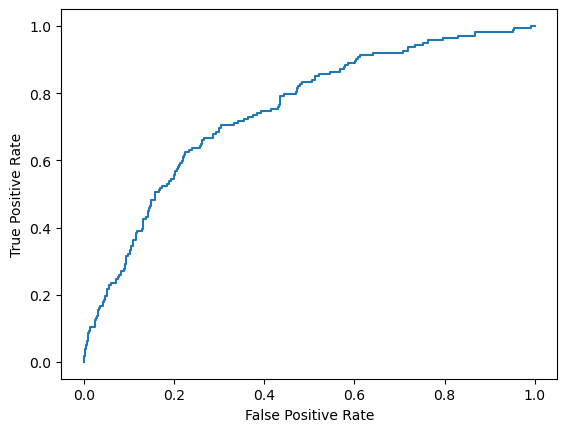

In [80]:
plt.plot(fpr, tpr) # by this graph we check performance of our classifier.
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('ROC_Curve.png')

#### Here we can see, the ROC curve is tends towards the top left corner ,hence our model performance is better than the previous one.  

# KNN

## Normalization - scaling techinque

In [81]:
Norm = MinMaxScaler()
#Norm.fit(x)
Norm_array = Norm.fit_transform(x)
df_new = pd.DataFrame(Norm_array,columns=x.columns)
df_new

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose
0,0.000000,0.105263,1.000000,1.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.203285,0.399527,0.529101,0.338149,0.275510,0.098870
1,0.000295,0.368421,0.000000,0.0,1.0,0.142857,0.0,0.0,0.0,0.0,0.281314,0.153664,0.243386,0.107493,0.438776,0.152542
2,0.000590,0.473684,0.000000,1.0,1.0,0.285714,0.0,0.0,1.0,0.0,0.246407,0.352246,0.423280,0.301175,0.234694,0.152542
3,0.000885,0.842105,0.000000,0.0,1.0,0.428571,0.0,0.0,0.0,0.0,0.262834,0.250591,0.391534,0.256121,0.255102,0.104520
4,0.001181,0.763158,0.666667,0.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.326489,0.465721,0.772487,0.412341,0.408163,0.070621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3184,0.998524,0.763158,0.000000,0.0,0.0,0.000000,0.0,0.0,1.0,0.0,0.213552,0.465721,0.402116,0.269833,0.612245,0.206215
3185,0.998819,0.736842,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.303901,0.189125,0.328042,0.326151,0.255102,0.177966
3186,0.999115,0.368421,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.176591,0.087470,0.084656,0.146915,0.357143,0.124294
3187,0.999410,0.315789,0.666667,1.0,1.0,0.042857,0.0,0.0,1.0,0.0,0.490760,0.380615,0.751323,0.317336,0.285714,0.090395


In [82]:
## Splitting the data

In [83]:
x_train, x_test, y_train, y_test = train_test_split(df_new, y, test_size=0.3, random_state=1) # df_new = new splitting dataframe 

In [84]:
## Model Training

In [85]:
Knn_model = KNeighborsClassifier()  # knn_model = instance created,creating KNN Classifier
Knn_model.fit(x_train_sm,y_train_sm)   #fit the model for training data

KNeighborsClassifier()

In [86]:
### Evaluation

In [87]:
## Testing Data Evualation
y_pred = Knn_model.predict(x_test)
cf_matrix = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix is:\n', cf_matrix)

acc_score_test= accuracy_score(y_test, y_pred)
print('\nAccuracy is:',acc_score_test)

clf_Report = classification_report(y_test, y_pred)
print('\nClassification Report is:\n',clf_Report)


Confusion Matrix is:
 [[519 276]
 [ 80  82]]

Accuracy is: 0.6280041797283177

Classification Report is:
               precision    recall  f1-score   support

           0       0.87      0.65      0.74       795
           1       0.23      0.51      0.32       162

    accuracy                           0.63       957
   macro avg       0.55      0.58      0.53       957
weighted avg       0.76      0.63      0.67       957



#### For Testing data- We have reduced the accuracy to 63% as compared to previous model but the recall value of minority class has also improved to 51 %. 
#### This is a good model compared to the previous one. Recall is better. 

In [88]:
## Training Data Evaluation
y_pred_train = Knn_model.predict(x_train)
cf_matrix = confusion_matrix(y_train,y_pred_train)
print('\nConfusion Matrix is:\n', cf_matrix)

acc_score_knn= accuracy_score(y_train,y_pred_train)
print('\nAccuracy is:',acc_score_knn)

clf_Report = classification_report(y_train,y_pred_train)
print('\nClassification Report is:\n',clf_Report)


Confusion Matrix is:
 [[1445  474]
 [   6  307]]

Accuracy is: 0.7849462365591398

Classification Report is:
               precision    recall  f1-score   support

           0       1.00      0.75      0.86      1919
           1       0.39      0.98      0.56       313

    accuracy                           0.78      2232
   macro avg       0.69      0.87      0.71      2232
weighted avg       0.91      0.78      0.82      2232



####  For Training Data - We have reduced the accuracy to 78% as compared to previous model but 
#### the recall value of minority class has also improved to 98 %. 
#### This is a good model compared to the previous one. Recall is better. 

In [89]:
## Hyperparameter Tunning

In [90]:
knn_model = KNeighborsClassifier()
hyp = {'p':[1,2],  # p - parameter(distance metric) 1 = manhaton distance, 2 = Euclodean distance
       'n_neighbors' : np.arange(3,30)} 
gscv_knn_model = GridSearchCV(knn_model, hyp, cv=5) # cv= cross validation
gscv_knn_model.fit(x_train_sm,y_train_sm)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
                         'p': [1, 2]})

In [91]:
gscv_knn_model.best_params_     

{'n_neighbors': 4, 'p': 1}

In [92]:
y_pred_new = gscv_knn_model.predict(x_test)

acc_score_KNN= accuracy_score(y_test,y_pred_new)
print('Accuracy:', acc_score_KNN) # testing Accuracy

Accuracy: 0.7105538140020898


## Decision Tree

In [93]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train_sm,y_train_sm)


DecisionTreeClassifier()

In [94]:
# Testing data evaluation
y_pred = dt_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print('confusion matrix :\n',cnf_matrix)

acc_score_DT = accuracy_score(y_test,y_pred)
print("Accuracy Score : ",acc_score_DT)

clf_report = classification_report(y_test , y_pred)
print('classification_report : \n',clf_report)



confusion matrix :
 [[616 179]
 [102  60]]
Accuracy Score :  0.7063740856844305
classification_report : 
               precision    recall  f1-score   support

           0       0.86      0.77      0.81       795
           1       0.25      0.37      0.30       162

    accuracy                           0.71       957
   macro avg       0.55      0.57      0.56       957
weighted avg       0.76      0.71      0.73       957



#### For Testing data- We have reduced the accuracy to 70% as compared to previous model but 
#### the recall value of minority class has also improved to 37 %. 
#### This is a good model compared to the previous one. Recall is better. 

In [95]:
# Training data evaluation
y_pred_train= dt_model.predict(x_train_sm)

cnf_matrix = confusion_matrix(y_train_sm,y_pred_train)
print('confusion matrix :\n',cnf_matrix)

acc_score_dt = accuracy_score(y_train_sm,y_pred_train)
print("Accuracy Score : ",acc_score_dt)

clf_report = classification_report(y_train_sm,y_pred_train)
print('classification_report : \n',clf_report)

confusion matrix :
 [[1919    0]
 [   0 1919]]
Accuracy Score :  1.0
classification_report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1919
           1       1.00      1.00      1.00      1919

    accuracy                           1.00      3838
   macro avg       1.00      1.00      1.00      3838
weighted avg       1.00      1.00      1.00      3838



In [96]:
dt_model=DecisionTreeClassifier()
hyp = {'criterion':['gini','entropy'],
       'max_depth':np.arange(2,10),
       'min_samples_split':np.arange(2,10),
       'min_samples_leaf':np.arange(2,10)
        
      
      }
rscv_model = RandomizedSearchCV(dt_model,hyp,random_state=10,cv=5)
rscv_model.fit(x_train_sm,y_train_sm)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_leaf': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_split': array([2, 3, 4, 5, 6, 7, 8, 9])},
                   random_state=10)

In [97]:
rscv_model.best_estimator_

DecisionTreeClassifier(max_depth=7, min_samples_leaf=2)

In [98]:
dt_model = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=2,
                      min_samples_split=7)
dt_model.fit(x_train_sm,y_train_sm)

DecisionTreeClassifier(criterion='entropy', max_depth=6, min_samples_leaf=2,
                       min_samples_split=7)

In [99]:
plt.figure(figsize=(200,200))# used matplotlib library here
tree = plot_tree(dt_model, feature_names=x.columns, filled=True)
plt.savefig('Decision_Tree_reg.png')

## Random Forest

In [100]:
# Model Training with DT
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train_sm,y_train_sm)
# dt_model.cost_complexity_prunning_path(x_train,y_train)

DecisionTreeClassifier()

In [101]:
y_pred = dt_model.predict(x_test)

In [102]:
dt_acc = accuracy_score(y_test, y_pred)
print('Accuracy for DT is :', dt_acc)

Accuracy for DT is : 0.7053291536050157


In [103]:
# Model Training with RF
rf_model = RandomForestClassifier()
rf_model.fit(x_train_sm,y_train_sm)

RandomForestClassifier()

In [104]:
y_pred_rf = rf_model.predict(x_test)

In [105]:
rf_acc = accuracy_score(y_test, y_pred_rf)
print('Accuracy for RF is :', rf_acc)

Accuracy for RF is : 0.7910135841170324


In [106]:
rf_model = RandomForestClassifier()

hyp = {'criterion': ['gini','entropy'],
       'n_estimators': np.arange(10,200,10),
       'max_depth': np.arange(2,10),
       'min_samples_split': np.arange(2,20),
       'min_samples_leaf': np.arange(2,10)}

rscv_rf_clf = RandomizedSearchCV(rf_model, hyp, cv=7)
rscv_rf_clf.fit(x_train_sm,y_train_sm)

RandomizedSearchCV(cv=7, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_leaf': array([2, 3, 4, 5, 6, 7, 8, 9]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19]),
                                        'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])})

In [107]:
# Train data Accuracy
y_pred_train = rscv_rf_clf.predict(x_train_sm)

cnf_matrix = confusion_matrix(y_train_sm,y_pred_train)
print('\nConfusion MAtrix: ',cnf_matrix)

acc_score_rf = accuracy_score(y_train_sm,y_pred_train)
print('\nAccuracy score is', acc_score_rf)

clf_report = classification_report(y_train_sm,y_pred_train)
print('classification_report : \n',clf_report)


Confusion MAtrix:  [[1629  290]
 [ 130 1789]]

Accuracy score is 0.890568004168838
classification_report : 
               precision    recall  f1-score   support

           0       0.93      0.85      0.89      1919
           1       0.86      0.93      0.89      1919

    accuracy                           0.89      3838
   macro avg       0.89      0.89      0.89      3838
weighted avg       0.89      0.89      0.89      3838



In [108]:
# Test data Accuracy
y_pred = rscv_rf_clf.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print('\nConfusion MAtrix:\n ',cnf_matrix)

acc_score_RF = accuracy_score(y_test,y_pred)
print('\nAccuracy score is\n', acc_score_RF)

clf_report = classification_report(y_train_sm,y_pred_train)
print('classification_report : \n',clf_report)


Confusion MAtrix:
  [[616 179]
 [ 85  77]]

Accuracy score is
 0.7241379310344828
classification_report : 
               precision    recall  f1-score   support

           0       0.93      0.85      0.89      1919
           1       0.86      0.93      0.89      1919

    accuracy                           0.89      3838
   macro avg       0.89      0.89      0.89      3838
weighted avg       0.89      0.89      0.89      3838



In [ ]:
#### For Testing data- We have reduced the accuracy to 72% as compared to previous model but the recall value of minority class has also improved to 93 %. 
#### This is a good model compared to the previous one. Recall is better. 

In [109]:
print('acc_score_LR :',acc_score_LR,'acc_score_KNN :',acc_score_KNN,'acc_score_DT :',acc_score_DT,'acc_score_RF :',acc_score_RF)

acc_score_LR : 0.7366771159874608 acc_score_KNN : 0.7105538140020898 acc_score_DT : 0.7063740856844305 acc_score_RF : 0.7241379310344828


#### From the above accuracy of Logistic Regression , KNN , Decision Tree and Random forest . 
#### The results showed that the Random Forest model outperformed others with an accuracy of 72% in predicting the risk of Coronary Heart Disease(CHD), having best recall of 93% than the other models.